In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image

import dataset

from model import initialize_weights, Generator, Discriminator
from utils import plot_images, scale_image, unnorm
from PIL import Image

In [5]:
# hyperparameters
#NOTE: according to the paper DCGAN is sensible to hyperparameters 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 128
IMAGE_SIZE = 64
REAL_SIZE = 631
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 5
FEATURES_DISC = 64
FEATURES_GEN = 64
norm=((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))


In [6]:
transform  = transforms.Compose(
    [
        transforms.ToPILImage(),
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)


In [7]:
csv_file = './bayc/bayc/hashes.csv'
root_dir = './bayc/bayc/'
dataset = dataset.BAYCDataset(csv_file, root_dir, transform=transform)

In [8]:
loader = DataLoader(dataset=dataset, batch_size=BATCH_SIZE,drop_last=True, shuffle=True)


In [9]:
def show_batch(data_loader):
    for images in data_loader:
        images = images.to(device)
        batch_size = len(images)
        fig, ax = plt.subplots(figsize=(15, 15))
        ax.set_xticks([]) 
        ax.set_yticks([])
        unnorm_images = unnorm(images, *norm).cpu()
        ax.imshow(make_grid(unnorm_images[:batch_size], nrow=8).permute(1, 2, 0).clamp(0,1))
        #save_image(unnorm_images, f"gan_images/test.png")
        break

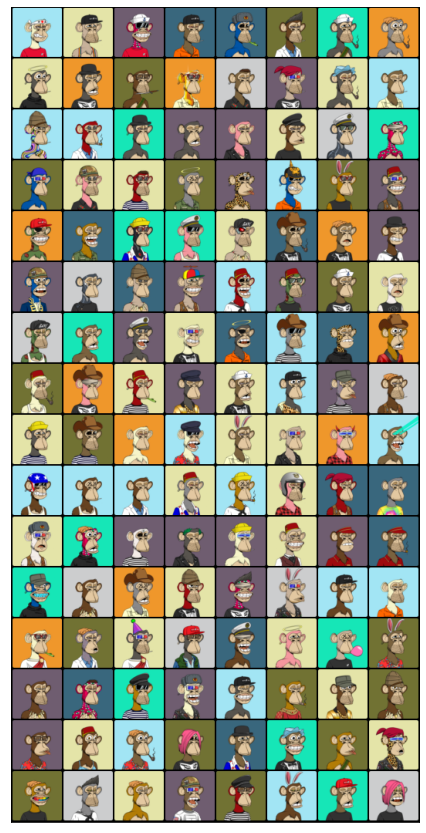

In [10]:
show_batch(loader)

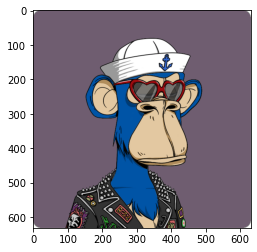

In [11]:
from PIL import Image
idx = np.random.randint(len(dataset))
img_hash = dataset.annotations['IPFS HASH'][idx]
img = Image.open(os.path.join(dataset.root_dir, img_hash +'.png'))
plt.imshow(img);

In [12]:
# instantiate both models
#generator = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
#discriminator = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)
generator = torch.load("./generator.pth")
discriminator = torch.load("./discriminator.pth")

In [13]:
len(dataset)

10000

In [29]:
# init weights
#initialize_weights(generator)
#initialize_weights(discriminator)

In [14]:
# set mode to train, redundant here
generator.train()
discriminator.train()


Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Flatten(start_dim=1, end_dim=-1)
    (6): Linear(in_features=8192, out_features=1, bias=T

In [13]:
# optimizer and loss, maybe BCEWithLogits is better here
opt_g = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_d = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

In [14]:
fixed_noise = torch.randn(32, Z_DIM).to(device)


In [15]:
if not os.path.exists("gan_images_bayc"):
    os.makedirs('gan_images_bayc')


Epoch [1/10] Batch 0/78                   Loss D: 0.0099, loss G: 6.2835


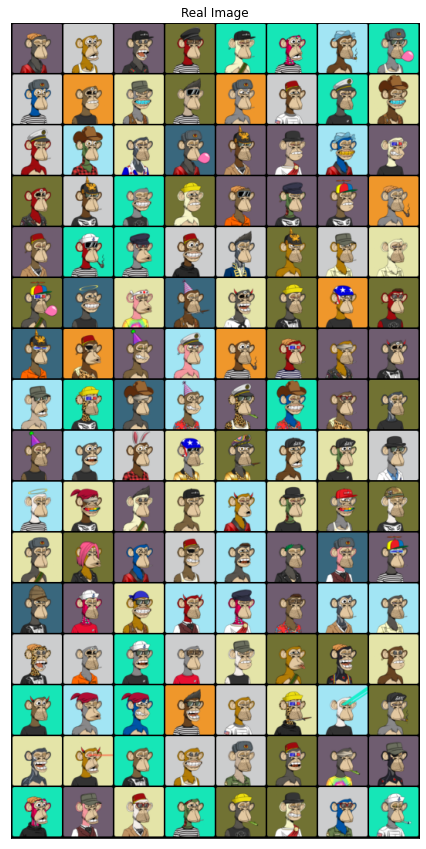

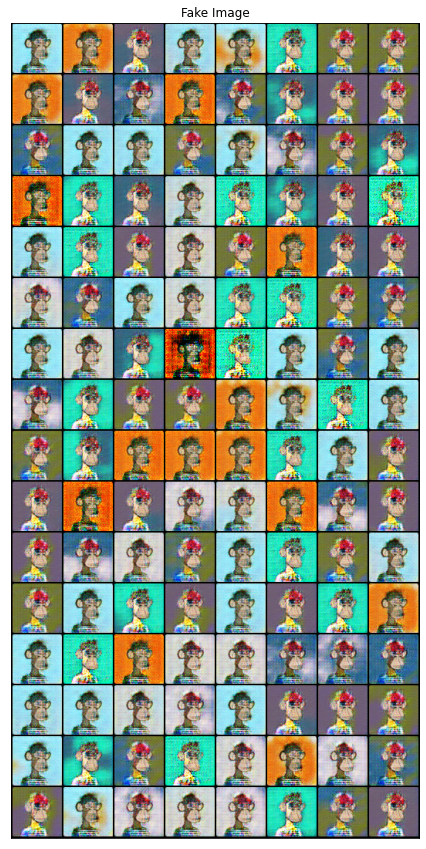

MODEL SAVED
Epoch [2/10] Batch 0/78                   Loss D: 0.0007, loss G: 7.0427


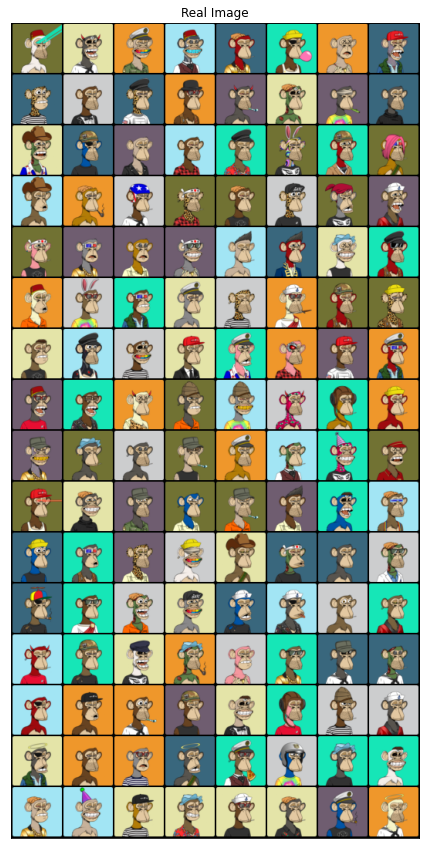

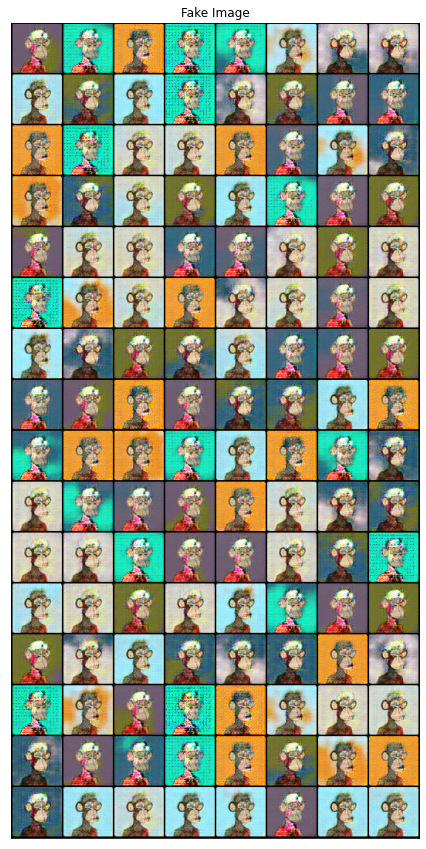

MODEL SAVED
Epoch [3/10] Batch 0/78                   Loss D: 0.0015, loss G: 8.5563


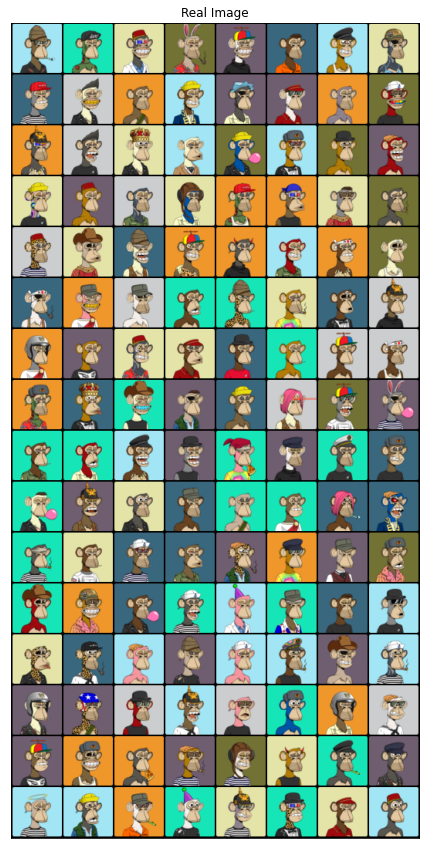

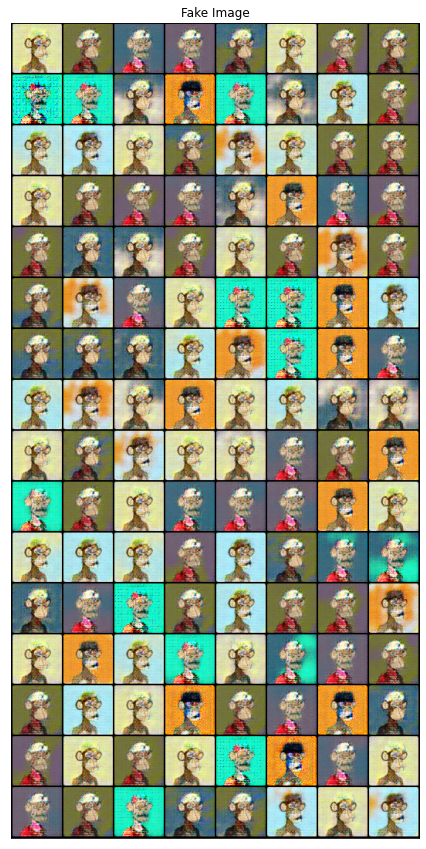

MODEL SAVED
Epoch [4/10] Batch 0/78                   Loss D: 0.2679, loss G: 2.5352


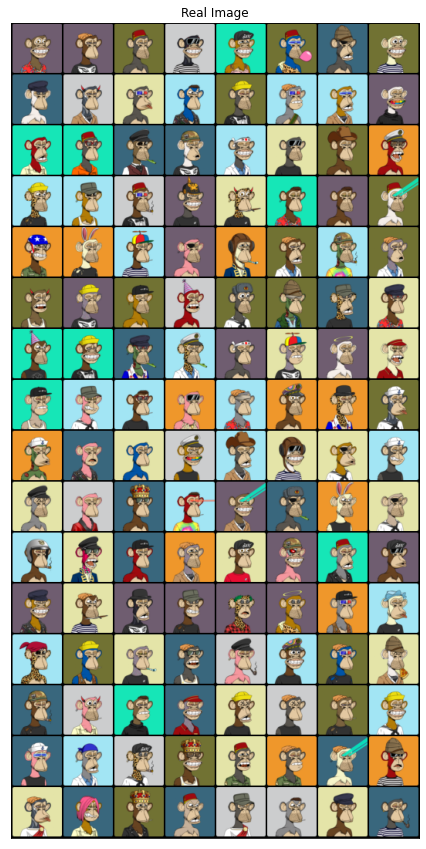

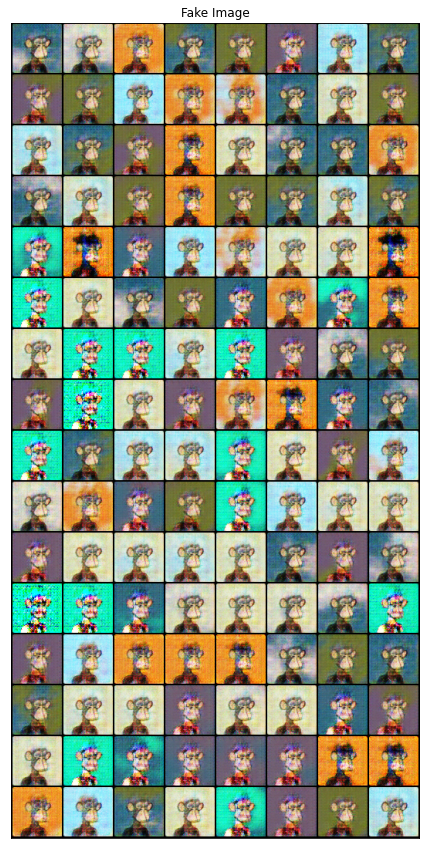

MODEL SAVED
Epoch [5/10] Batch 0/78                   Loss D: 0.0554, loss G: 3.2058


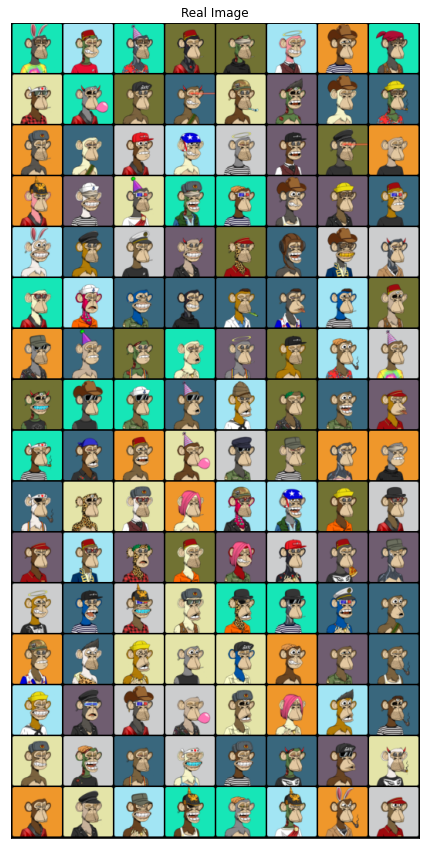

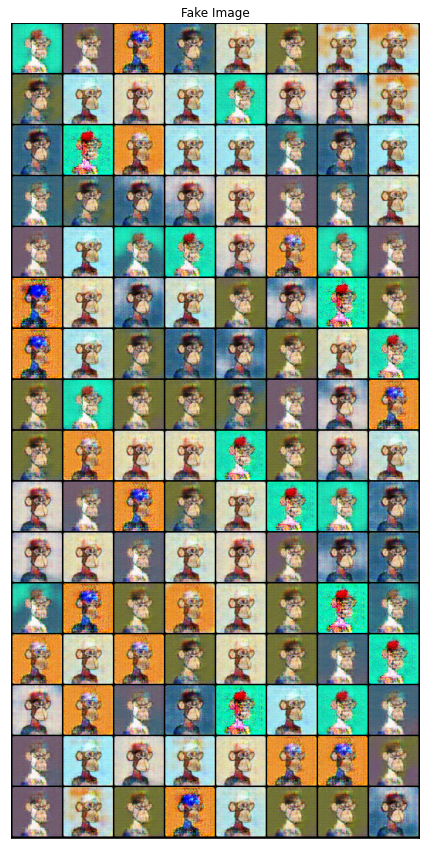

MODEL SAVED
Epoch [6/10] Batch 0/78                   Loss D: 0.0714, loss G: 2.1547


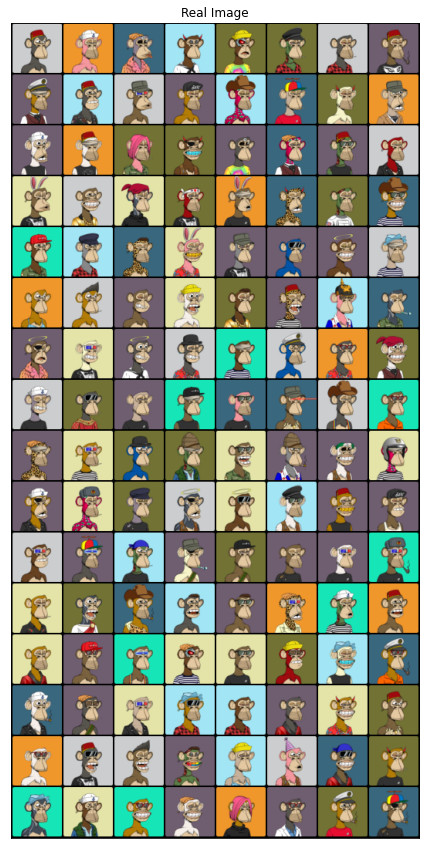

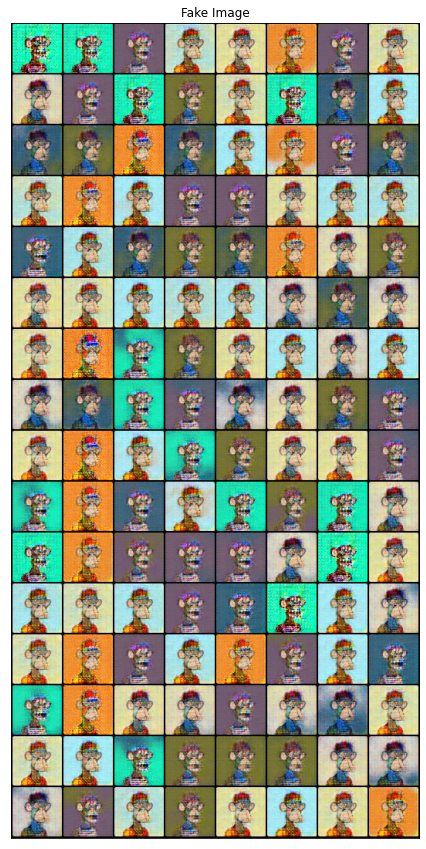

MODEL SAVED
Epoch [7/10] Batch 0/78                   Loss D: 0.0265, loss G: 3.3366


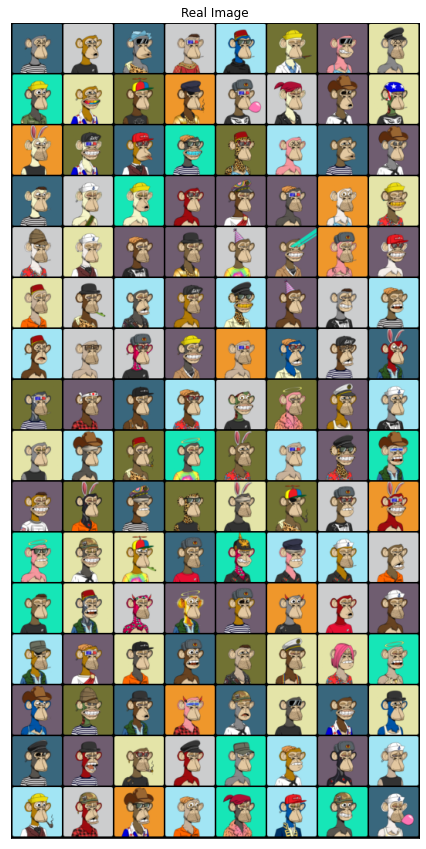

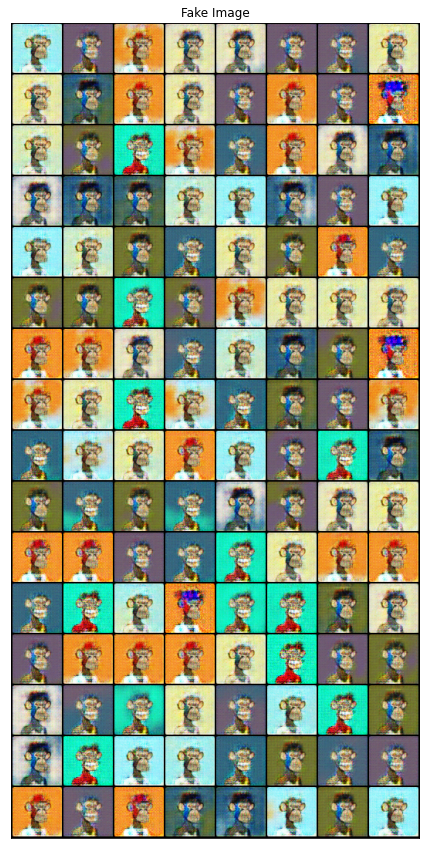

MODEL SAVED
Epoch [8/10] Batch 0/78                   Loss D: 0.0537, loss G: 4.7418


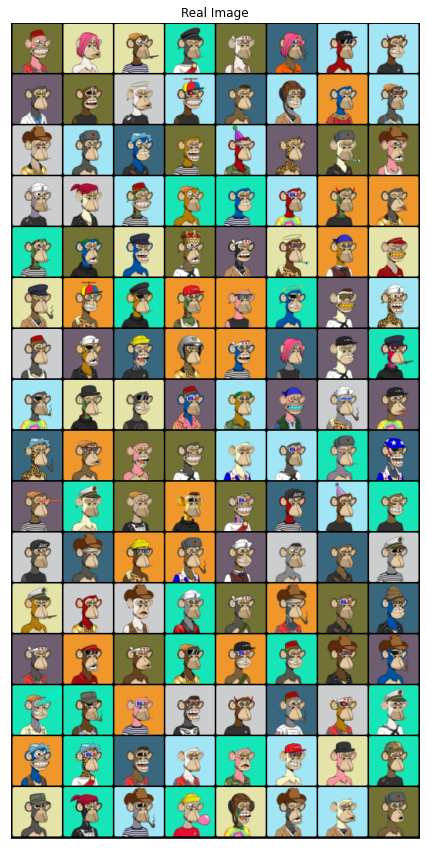

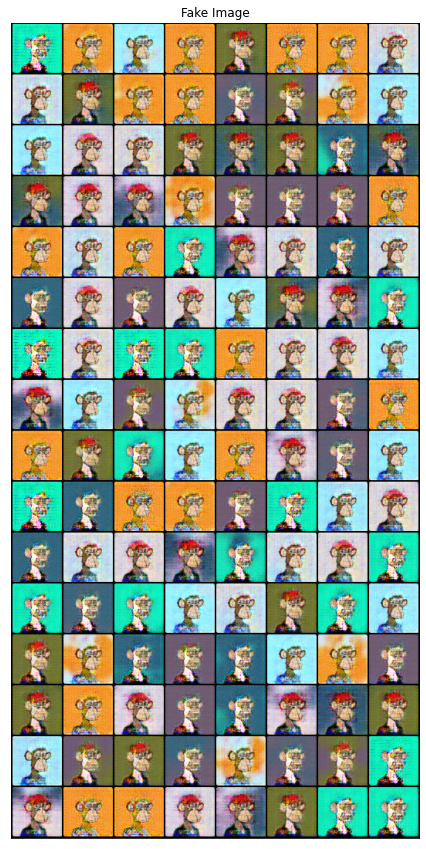

MODEL SAVED
Epoch [9/10] Batch 0/78                   Loss D: 0.0070, loss G: 4.5894


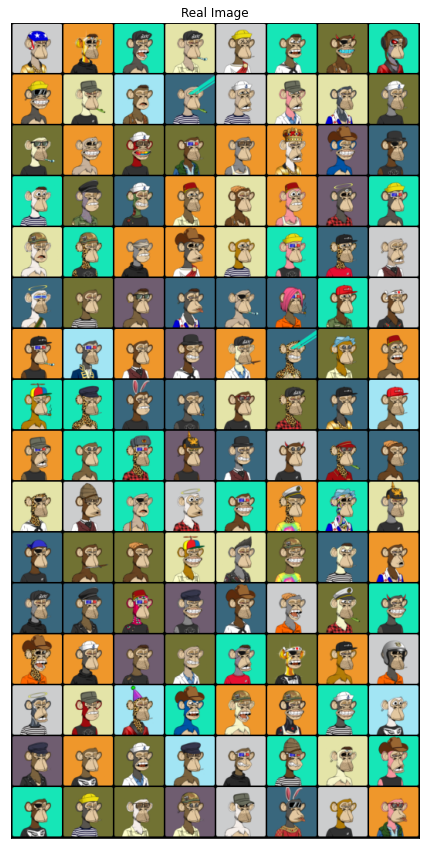

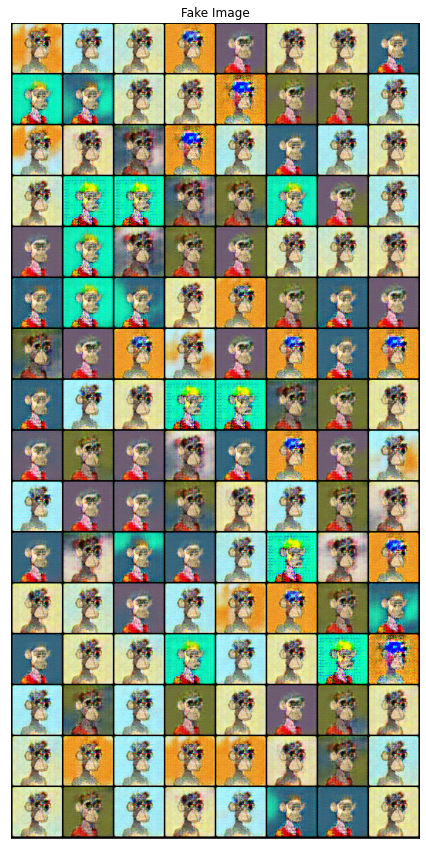

In [ ]:
run = 4
NUM_EPOCHS = 10
NUMS_TRAINS_GENERATOR = 1
for epoch in range(NUM_EPOCHS):
    
    for idx, inputs in enumerate(loader):
        inputs = inputs.to(device)
        noise = torch.randn((BATCH_SIZE, Z_DIM)).to(device)


        ### Train Discriminator
        ## get fake images
        fakes = generator(noise)
        
        outputs_real = discriminator(inputs).view(-1)
        outputs_fake = discriminator(fakes).view(-1)

        loss_real = criterion(outputs_real, torch.ones_like(outputs_real))
        loss_fake = criterion(outputs_fake, torch.zeros_like(outputs_fake))
        loss_d = 0.5 * (loss_real + loss_fake)

        opt_d.zero_grad()
        loss_d.backward(retain_graph=True)
        opt_d.step()

        ## Train generator more times more than disc
        for _ in range(NUMS_TRAINS_GENERATOR):
            noise = torch.randn((BATCH_SIZE, Z_DIM)).to(device)
            fakes = generator(noise)
            outputs_fake = discriminator(fakes).view(-1)
            loss_g = criterion(outputs_fake, torch.ones_like(outputs_fake))
            opt_g.zero_grad()
            loss_g.backward()
            opt_g.step()


    # Print losses occasionally and print to tensorboard
        if idx % 100 == 0:
            print(
                f"Epoch [{epoch + 1}/{NUM_EPOCHS}] Batch {idx}/{len(loader)} \
                  Loss D: {loss_d:.4f}, loss G: {loss_g:.4f}"
            )
            
            show_batch_images(inputs, "Real Image")
            show_batch_images(fakes, "Fake Image")
            save_image(unnorm(fakes, *norm), f"gan_images_bayc/{run}{epoch}{idx//100}.png")
            #fake_images = transforms(28)(fakes).reshape(-1, 1, 28, 28)
            #imgs = fakes.cpu().detach().reshape(-1, 64, 64)
            #save_image(scale_image(fakes), f"gan_images/{idx}{epoch+1}.png")
            
    torch.save(generator, './generator.pth')
    torch.save(discriminator, './discriminator.pth')
    print("MODEL SAVED")

In [15]:
def show_batch_images(images, title=""):
    images = images.to(device)
    batch_size = len(images)
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.set_xticks([]) 
    ax.set_yticks([])
    ax.set_title(title)
    unnorm_images = unnorm(images, *norm).cpu()
    ax.imshow(make_grid(unnorm_images[:batch_size], nrow=8).permute(1, 2, 0).clamp(0,1))
    plt.show()
    #save_image(unnorm_images, f"gan_images/test.png")
    
    

In [ ]:
torch.save(generator, './generator.pth')
torch.save(discriminator, './discriminator.pth')

In [16]:
generator.eval()
discriminator.eval()

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Flatten(start_dim=1, end_dim=-1)
    (6): Linear(in_features=8192, out_features=1, bias=T

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
gnerator = generator.to(device)
noise = torch.randn((1, 100)).to(device)


In [19]:
fake = generator(noise)
print(fake.shape)


torch.Size([1, 3, 64, 64])


In [31]:
unnorm_images = unnorm(fake, *norm).permute(0,2,3,1).clamp(0,1).cpu().detach().numpy()

In [32]:
unnorm_images.shape

(1, 64, 64, 3)

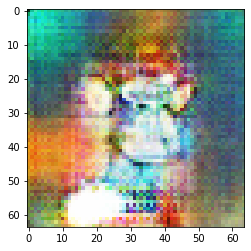

In [33]:
plt.imshow(unnorm_images[0])

In [17]:
def show_sample():
    noise = torch.randn((1, 100)).to(device)
    fake = generator(noise)
    unnorm_images = unnorm(fake, *norm).permute(0,2,3,1).clamp(0,1).cpu().detach().numpy()
    plt.imshow(unnorm_images[0])
    plt.show()

    

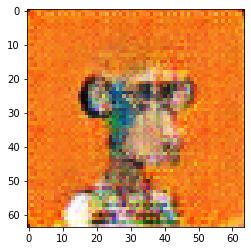

Continue? [Y/n] 


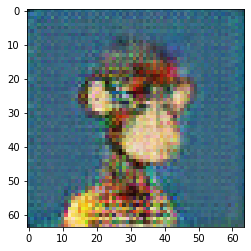

Continue? [Y/n] 


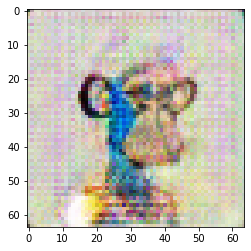

Continue? [Y/n] 


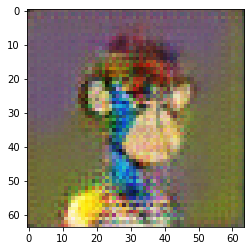

Continue? [Y/n] 


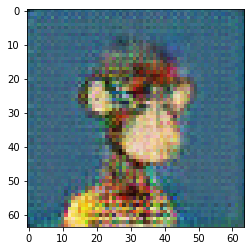

Continue? [Y/n] 


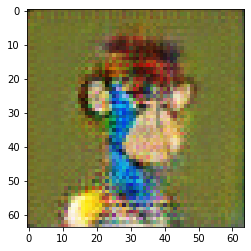

Continue? [Y/n] 


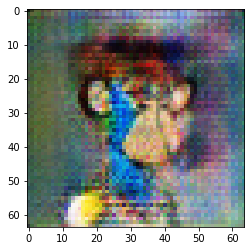

Continue? [Y/n] 


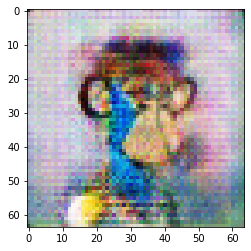

Continue? [Y/n] 


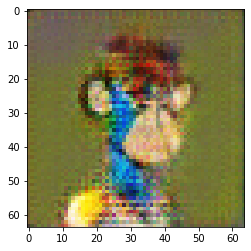

Continue? [Y/n] 


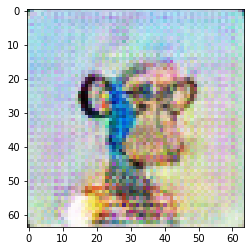

Continue? [Y/n] 


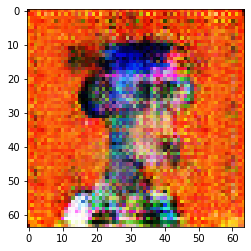

Continue? [Y/n] 


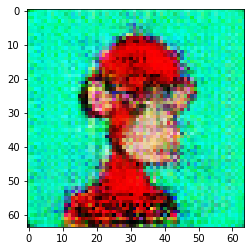

Continue? [Y/n] 


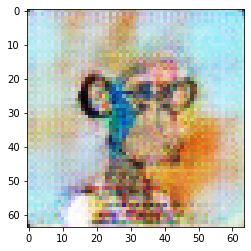

Continue? [Y/n] 


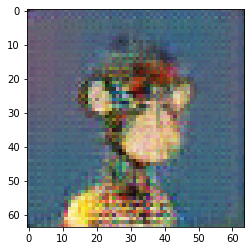

Continue? [Y/n] 


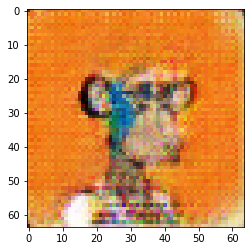

Continue? [Y/n] 


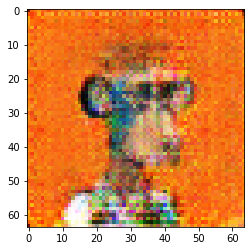

Continue? [Y/n] 


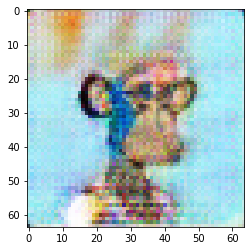

Continue? [Y/n] 


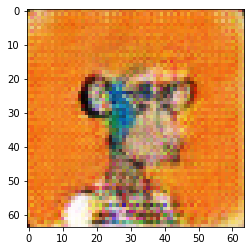

Continue? [Y/n] 


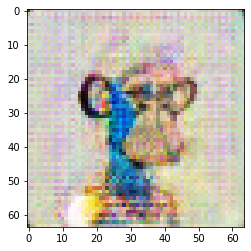

Continue? [Y/n] 


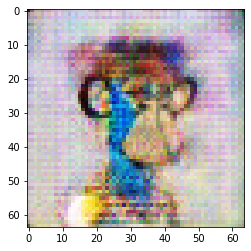

Continue? [Y/n] 


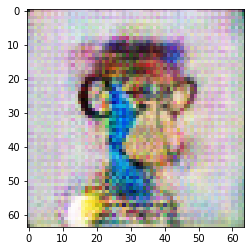

Continue? [Y/n] 


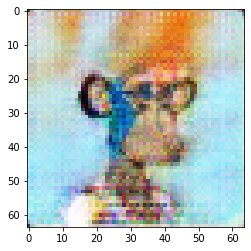

Continue? [Y/n] 


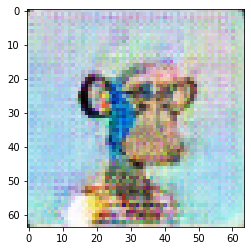

Continue? [Y/n] 


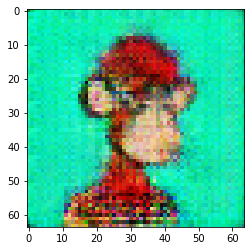

Continue? [Y/n] 


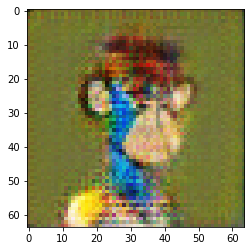

Continue? [Y/n] 


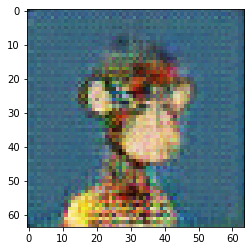

Continue? [Y/n] 


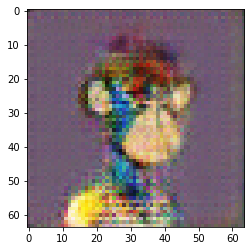

Continue? [Y/n] 


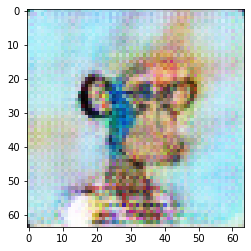

Continue? [Y/n] 


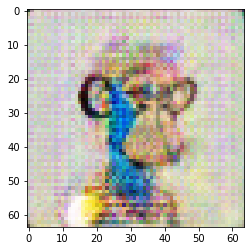

Continue? [Y/n] 


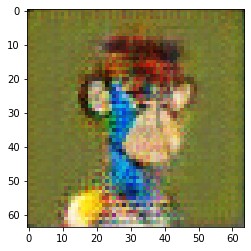

Continue? [Y/n] 


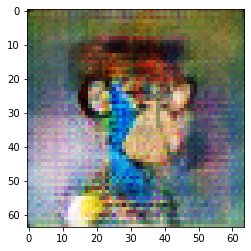

Continue? [Y/n] 


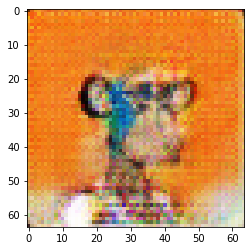

Continue? [Y/n] 


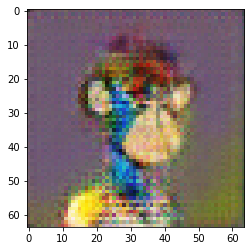

Continue? [Y/n] 


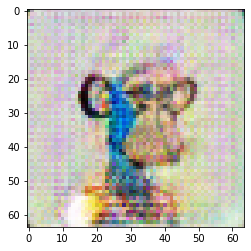

Continue? [Y/n] 


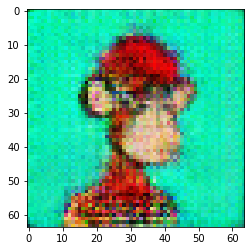

Continue? [Y/n] 


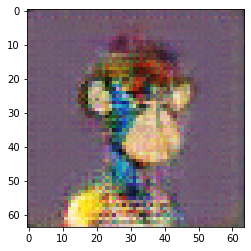

Continue? [Y/n] 


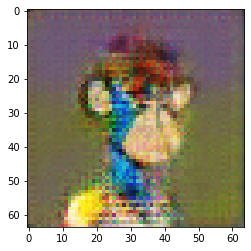

Continue? [Y/n] 


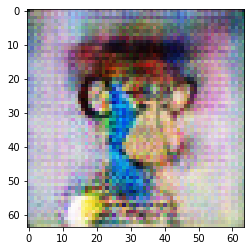

Continue? [Y/n] 


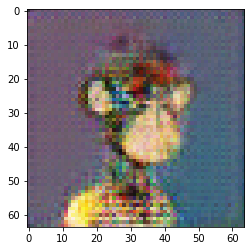

Continue? [Y/n] 


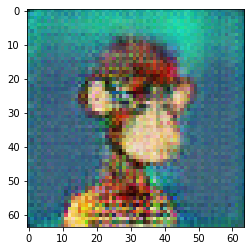

Continue? [Y/n] 


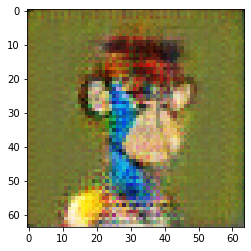

Continue? [Y/n] 


In [ ]:
while True:
    show_sample()
    ans = input("Continue? [Y/n]")
    if ans and ans.lower().startswith("n"):
        break
    else:
        plt.cla()